## Self-Driving Car Engineer Nanodegree

**Advanced Lane Finding Project**

The goals / steps of this project are the following:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Use color transforms, gradients, etc., to create a thresholded binary image.
4. Apply a perspective transform to rectify binary image ("birds-eye view").
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

### Set dependency

In [1]:
%matplotlib inline
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import os, sys 
sys.path.append('lib/')
from vtcv.dataset import visualize_dataset as vd
from functools import partial
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import pickle
import imageio
imageio.plugins.ffmpeg.download()

### 1. Camera calibration 
* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

# sample : 20  sampling_rate : 1.0  # of data : 20
size =  (512, 384, 3)


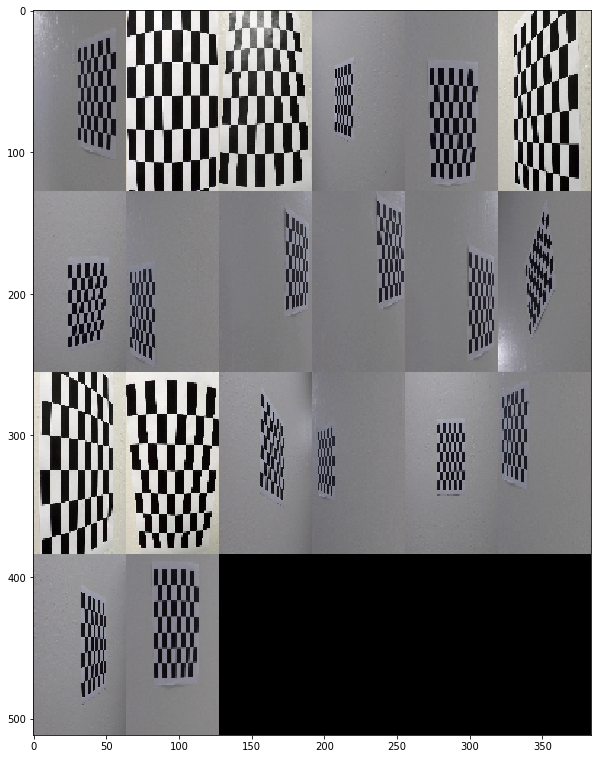

In [2]:
# Check camera calibration images
camcal_imgs = vd.show_sampled_dataset_from_dir('camera_cal',filepat='calibration*.jpg',sampling_rate=1.0)

In [3]:
def cam_calib(glob_patt,nx_corner,ny_corner,dpRslt=False,dpCol=4,save=True,picklePath="camparam.p"):
    camcal_imgs = glob.glob(glob_patt)
    # prepare object points
    nx = nx_corner; ny = ny_corner 

    # termination criteria
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((ny*nx,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d point in real world space
    imgpoints = [] # 2d points in image plane.

    nCol = dpCol
    residue = len(camcal_imgs) % nCol ; mult = int(len(camcal_imgs) / nCol)
    nRow = mult if residue == 0 else mult + 1

    if dpRslt :
        fig, axs = plt.subplots(5,4, figsize=(16, 11))
        fig.subplots_adjust(hspace = .1, wspace=.001)
        axs = axs.ravel()
        axs_set = [a.axis('off') for a in axs]

    for i, fname in enumerate(camcal_imgs) :
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        # Find the chess board corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)

        # If found, add object points, image points (after refining them)
        if ret == True:
            objpoints.append(objp)
            # refine the corner
            #corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
            imgpoints.append(corners)

            # Draw and display the corners
            if dpRslt :
                img = cv2.drawChessboardCorners(img, (nx,ny), corners,ret)
                axs[i].imshow(img)
                
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
    camparam = {}
    camparam['ret'] = ret
    camparam['mtx'] = mtx
    camparam['dist']= dist
    camparam['rvecs']= rvecs
    camparam['tvecs']= rvecs
    camparam['objpoints'] = objpoints
    camparam['imgpoints'] = imgpoints
    
    if save : 
        with open(picklePath, 'wb') as handle:
            pickle.dump(camparam, handle, protocol=pickle.HIGHEST_PROTOCOL)

    return camparam

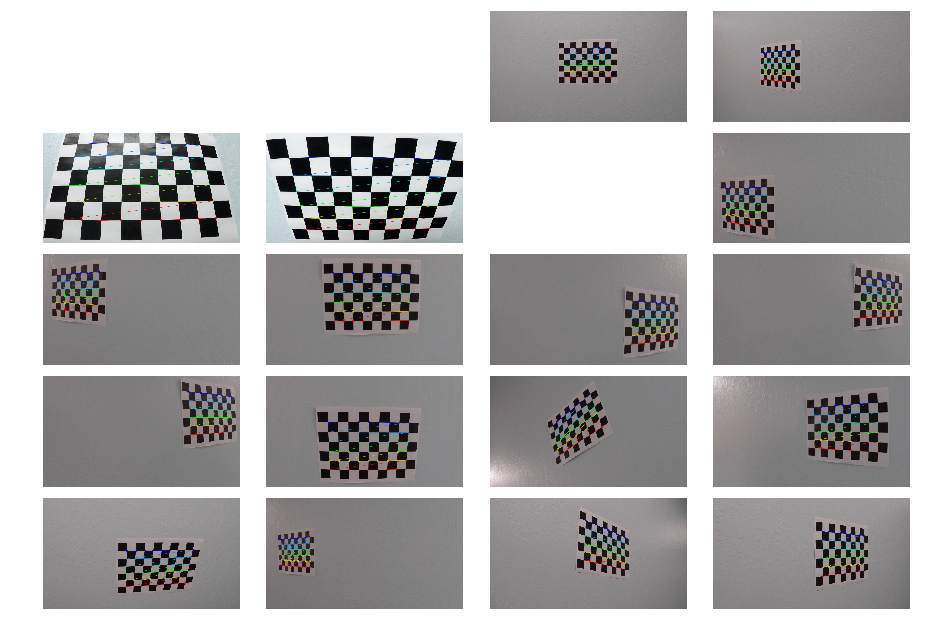

In [4]:
camparam = cam_calib('camera_cal/calibration*.jpg',9,6,dpRslt=True,dpCol=4)

In [3]:
def undistort_img(img, camparam, dpRslt=False):
    '''
    h,  w = img.shape[:2]
    newcameramtx, roi=cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))
    undist = cv2.undistort(img, mtx, dist, None, newcameramtx)
    # crop the image
    x,y,w,h = roi
    undist = undist[y:y+h, x:x+w]
    '''
    undist = cv2.undistort(img, camparam['mtx'], camparam['dist'], None, camparam['mtx'])
    
    if dpRslt :
        fig, axs = plt.subplots(1,2, figsize=(16, 11))
        fig.subplots_adjust(hspace = .1, wspace=.001)
        axs = axs.ravel()
        axs_set = [a.axis('off') for a in axs]    
        axs[0].imshow(img)
        axs[1].imshow(undist)
        
    return undist

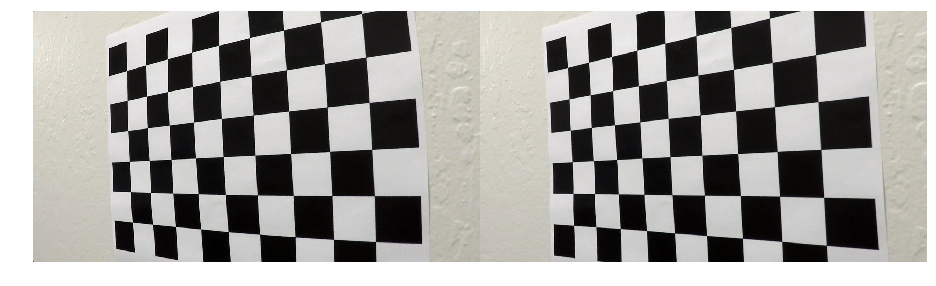

In [6]:
img = cv2.imread(camcal_imgs[5])
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
img = undistort_img(img, camparam, dpRslt=True )

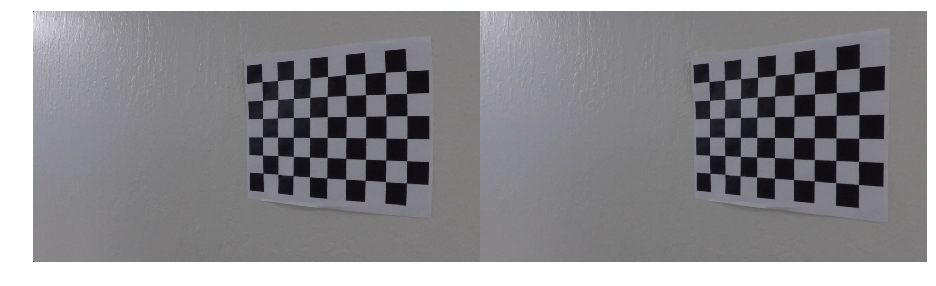

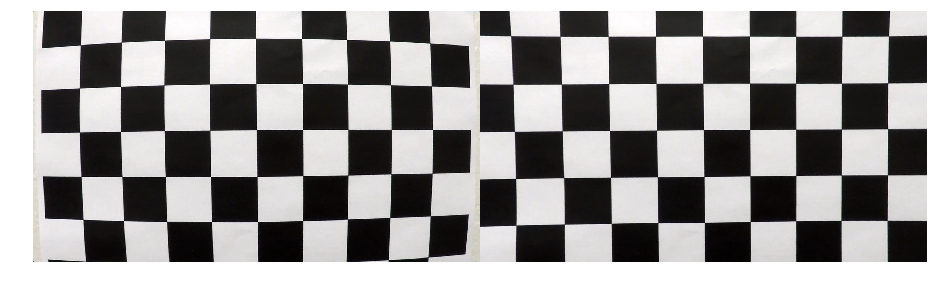

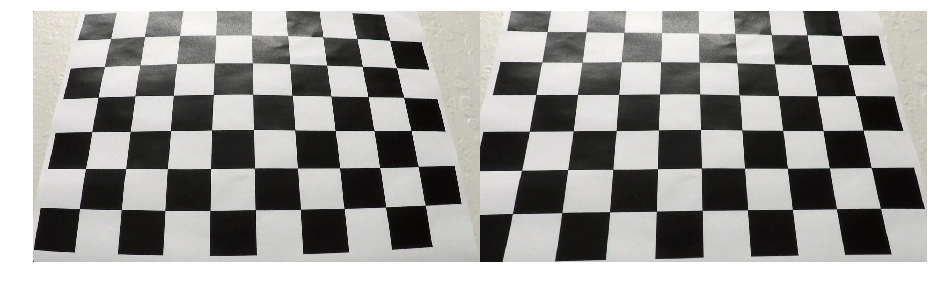

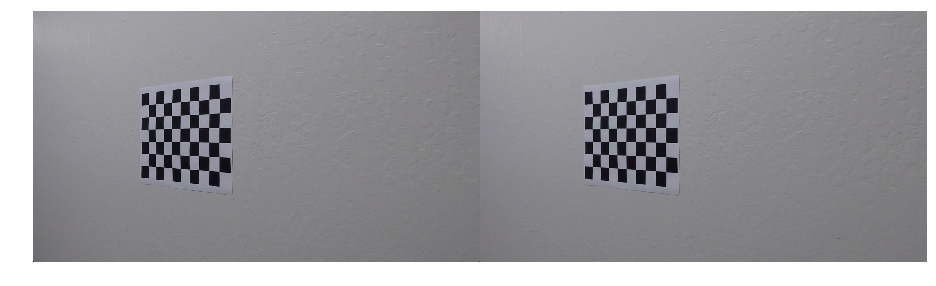

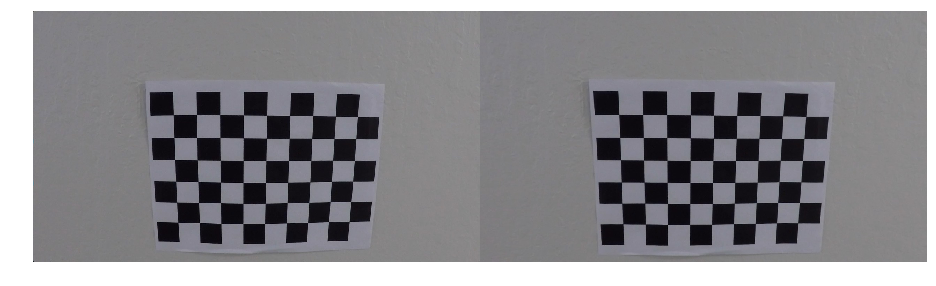

...

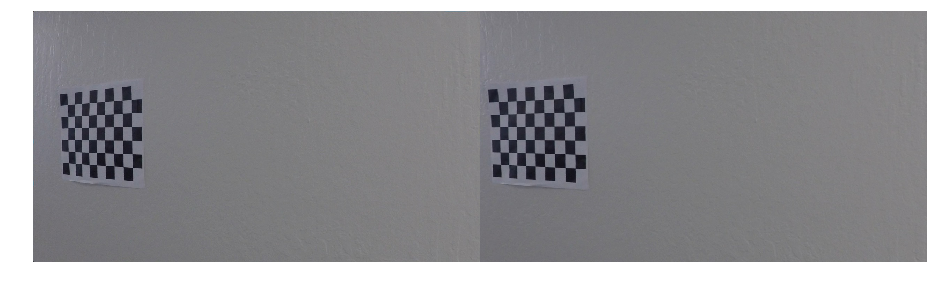

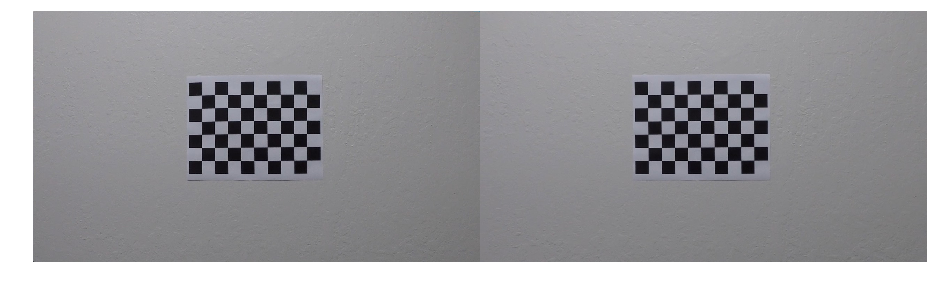

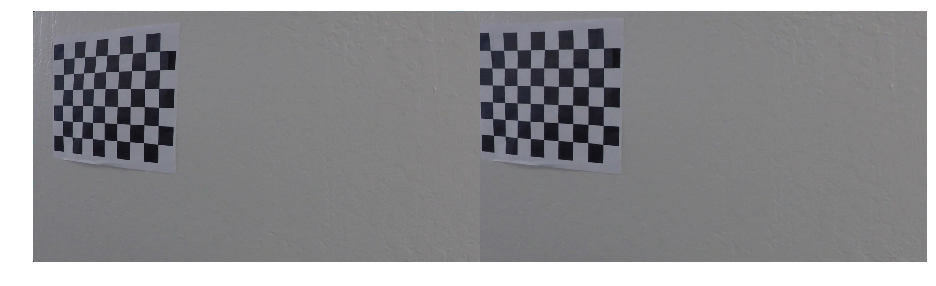

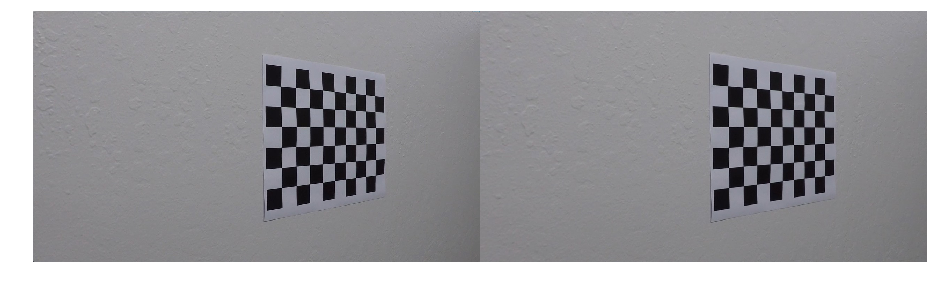

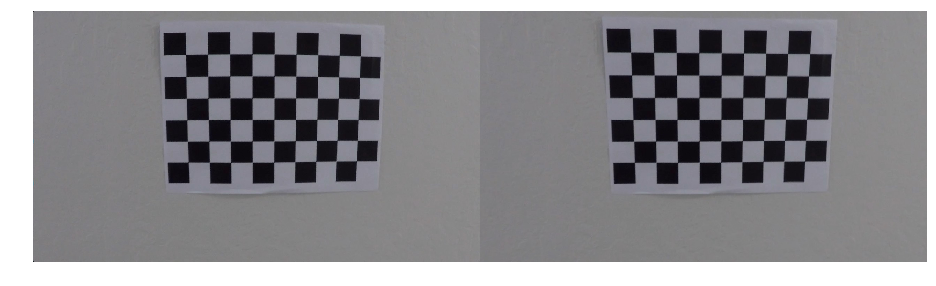

In [7]:
for img in camcal_imgs :
    img = cv2.imread(img)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    undistort_img(img, camparam, dpRslt=True )

# sample : 8  sampling_rate : 1.0  # of data : 8
size =  (256, 256, 3)


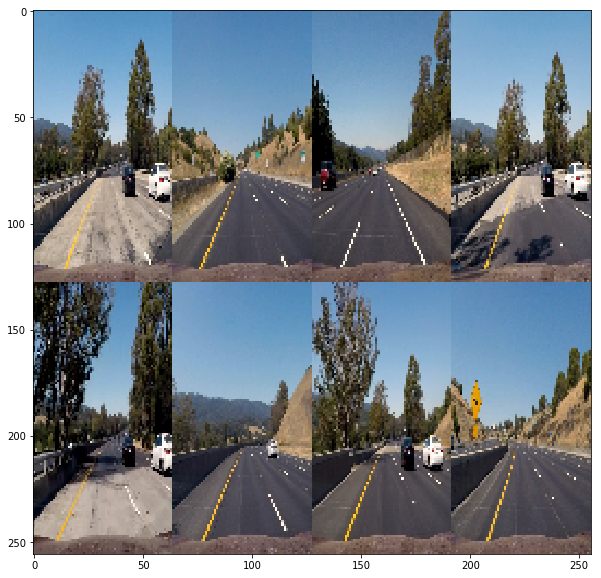

In [8]:
# Check camera calibration images
test_imgs = vd.show_sampled_dataset_from_dir('test_images',filepat='*.jpg',sampling_rate=1.0)

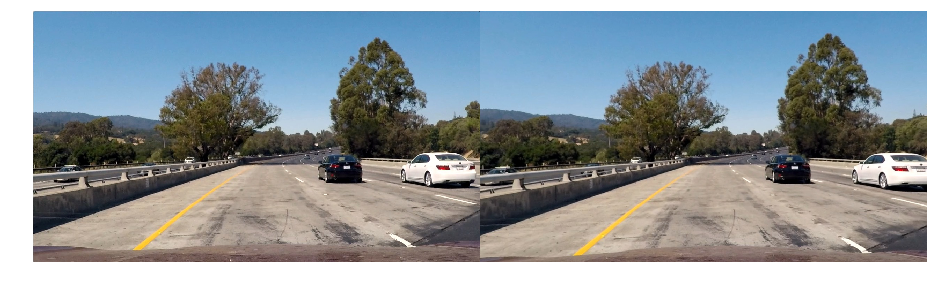

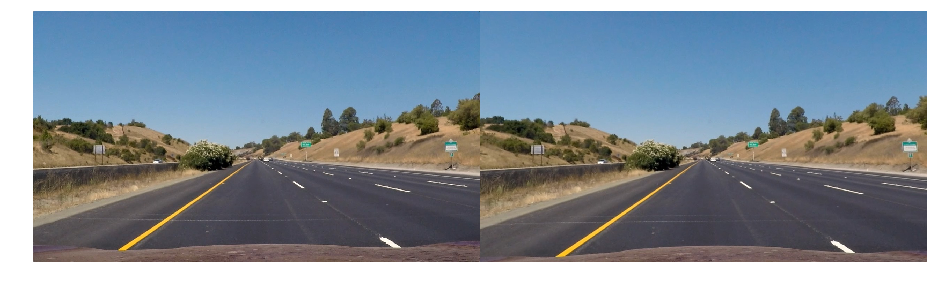

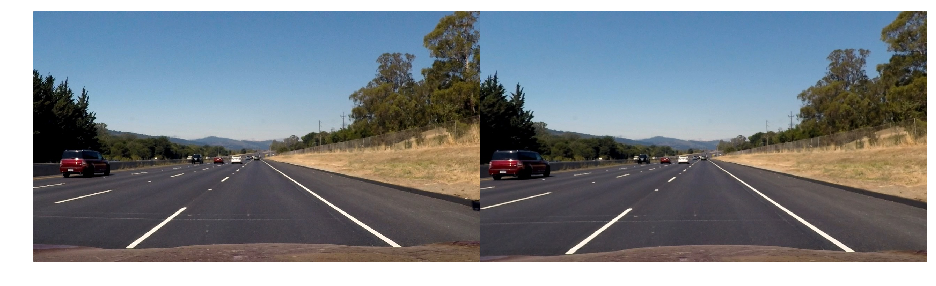

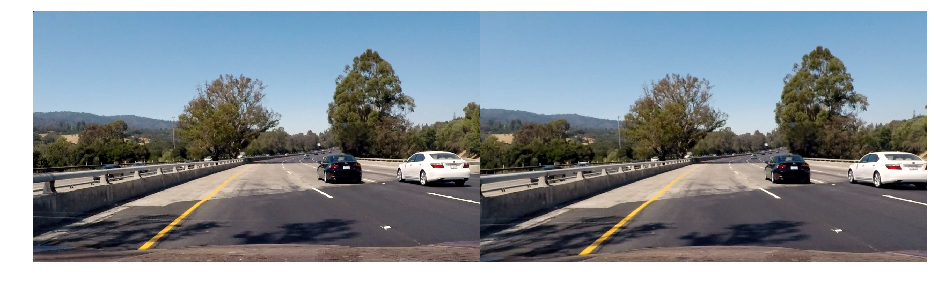

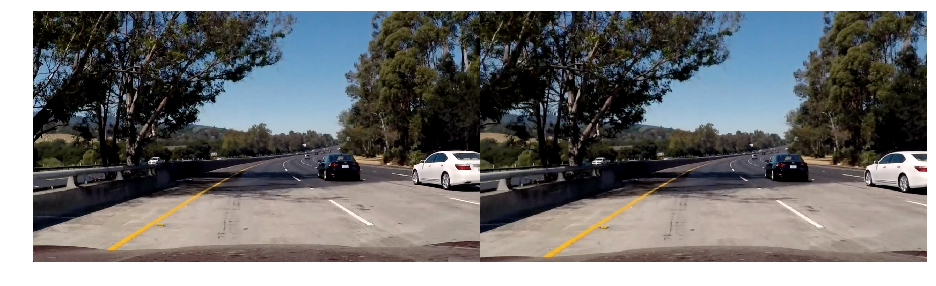

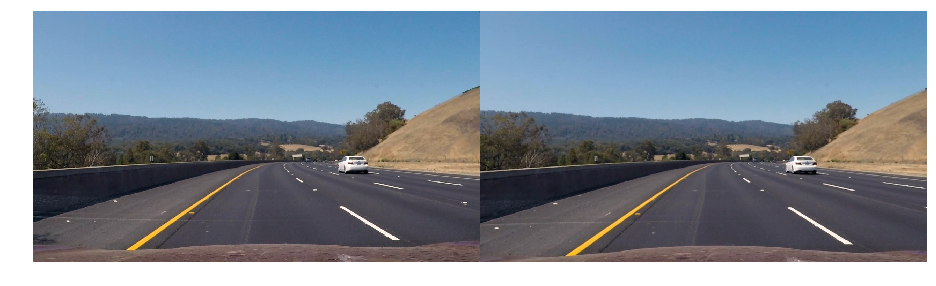

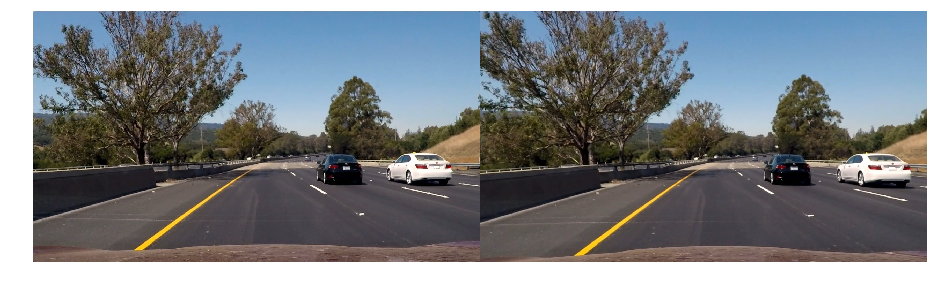

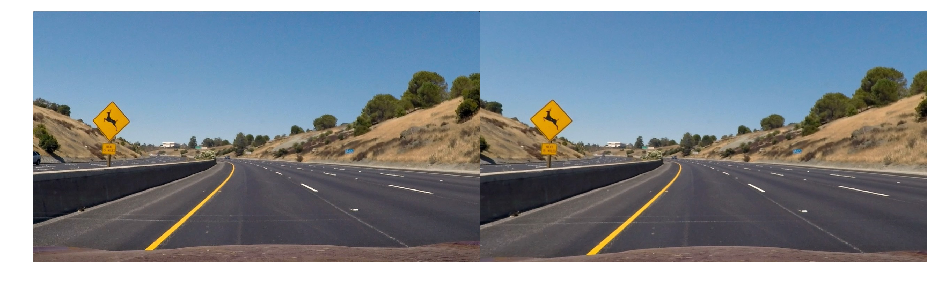

In [9]:
for img in test_imgs :
    img = cv2.imread(img)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    undistort_img(img, camparam, dpRslt=True )

### Restore (Load) parameters from the pickled file

In [12]:
with open('camparam.p', 'rb') as handle:
    camparam_loaded = pickle.load(handle)

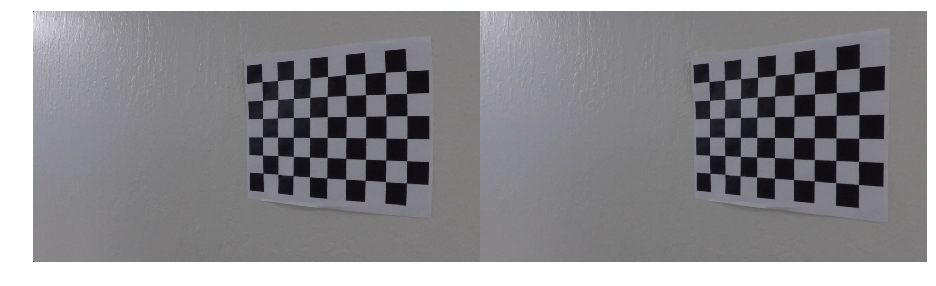

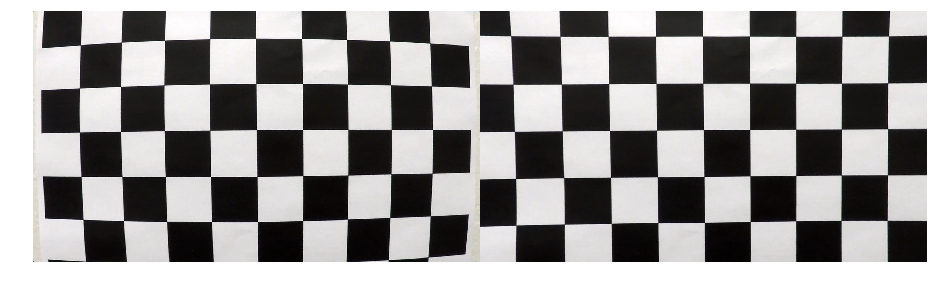

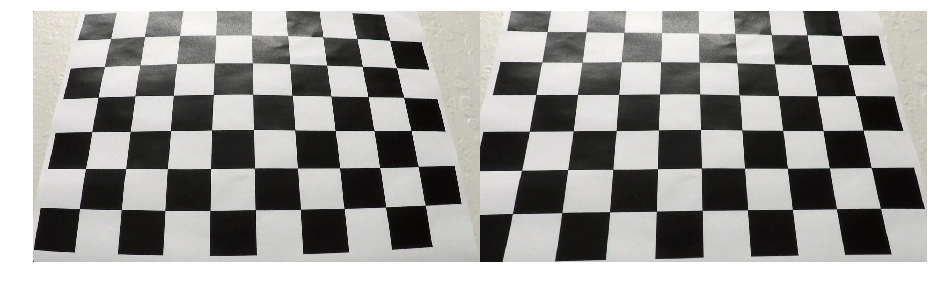

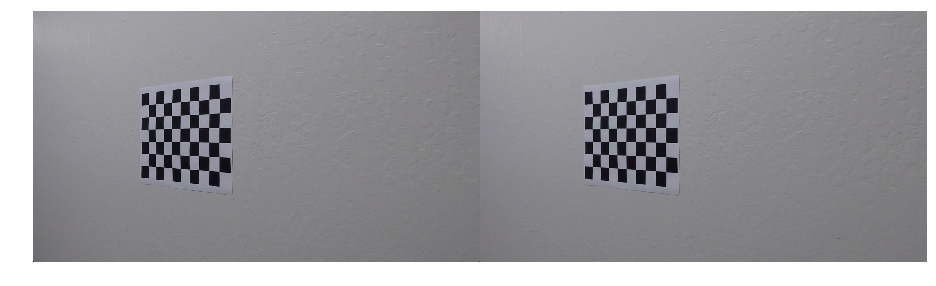

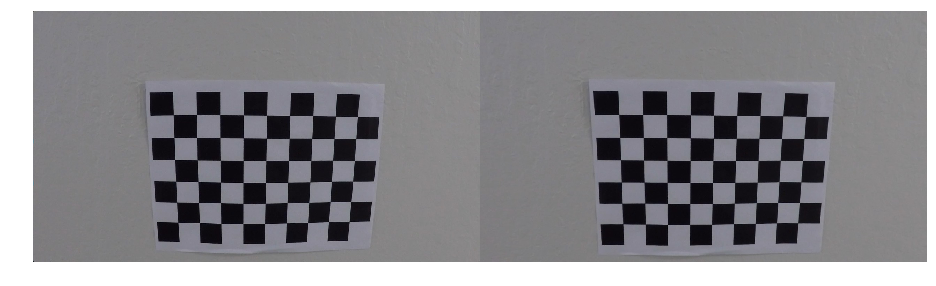

...

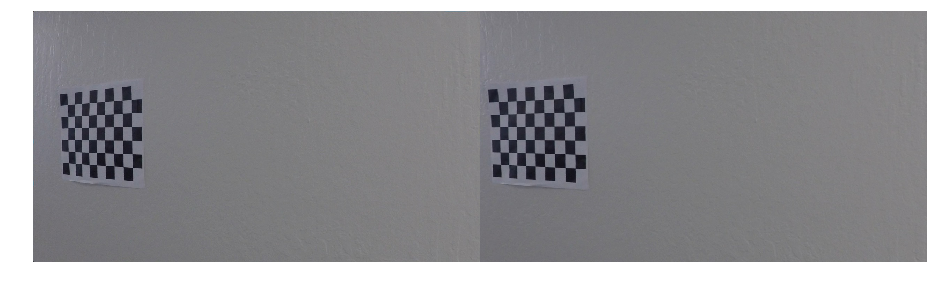

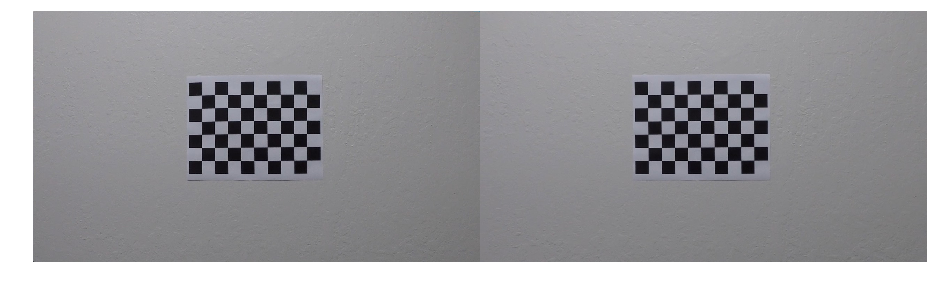

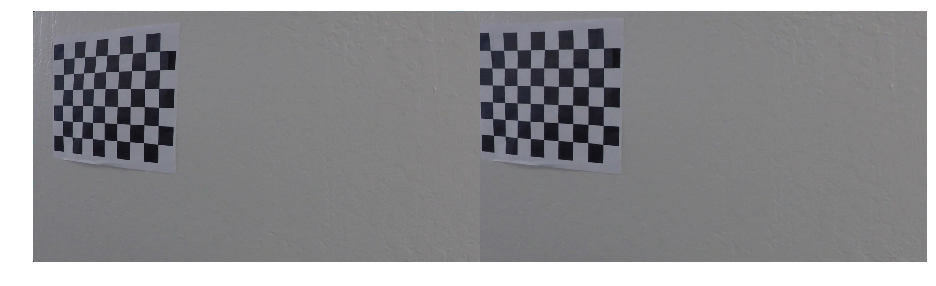

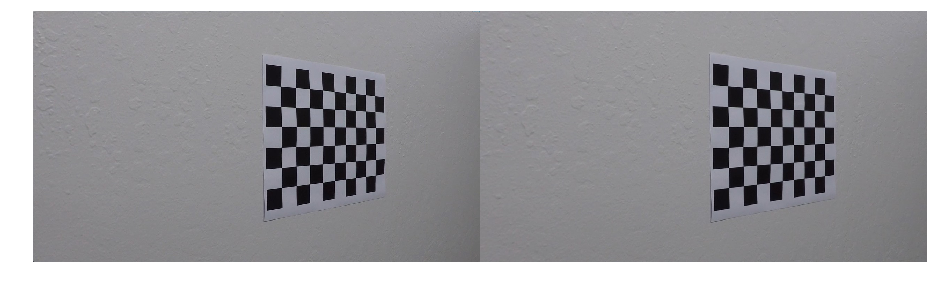

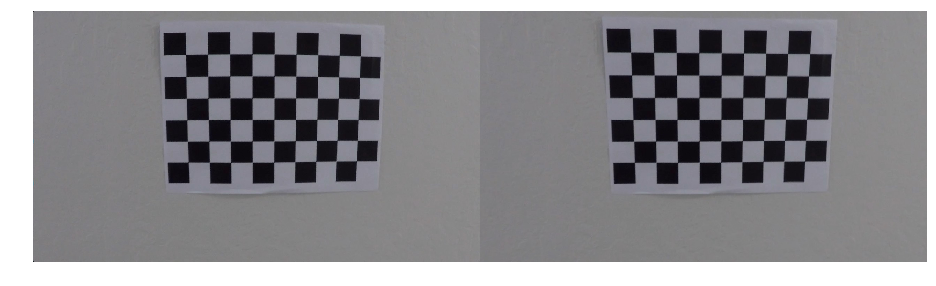

In [13]:
for img in camcal_imgs :
    img = cv2.imread(img)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    undistort_img(img, camparam, dpRslt=True )

### 2. Apply a distortion correction to raw images.

#### Apply frame undistortion to project video

In [2]:
## Input Video
project_video = 'project_video.mp4'
cahllenge_video = 'challenge_video.mp4'
harder_cahllenge_video = 'harder_challenge_video.mp4'

## Ouput
undist_project_video = 'temp/undistort_project_video.mp4'
undist_cahllenge_video = 'temp/undistort_challenge_video.mp4'
undist_harder_cahllenge_video = 'temp/undistort_harder_challenge_video.mp4'

In [14]:
with open('camparam.p', 'rb') as handle:
    camparam_loaded = pickle.load(handle)

clip = VideoFileClip(project_video)
undist_clip = clip.fl_image(partial(undistort_img, camparam=camparam_loaded, dpRslt=False ))
%time undist_clip.write_videofile(undist_project_video, audio=False)

[MoviePy] >>>> Building video temp/undistort_project_video.mp4
[MoviePy] Writing video temp/undistort_project_video.mp4


100%|█████████▉| 1260/1261 [00:34<00:00, 36.42it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: temp/undistort_project_video.mp4 

CPU times: user 29.5 s, sys: 6.71 s, total: 36.2 s
Wall time: 35.3 s


In [15]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(undist_project_video))

In [4]:
with open('camparam.p', 'rb') as handle:
    camparam_loaded = pickle.load(handle)

clip = VideoFileClip(cahllenge_video)
undist_clip = clip.fl_image(partial(undistort_img, camparam=camparam_loaded, dpRslt=False ))
%time undist_clip.write_videofile(undist_cahllenge_video, audio=False)

clip = VideoFileClip(harder_cahllenge_video)
undist_clip = clip.fl_image(partial(undistort_img, camparam=camparam_loaded, dpRslt=False ))
%time undist_clip.write_videofile(undist_harder_cahllenge_video, audio=False)

[MoviePy] >>>> Building video temp/undistort_challenge_video.mp4
[MoviePy] Writing video temp/undistort_challenge_video.mp4


100%|██████████| 485/485 [00:10<00:00, 48.00it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: temp/undistort_challenge_video.mp4 

CPU times: user 9.54 s, sys: 2.18 s, total: 11.7 s
Wall time: 10.7 s
[MoviePy] >>>> Building video temp/undistort_harder_challenge_video.mp4
[MoviePy] Writing video temp/undistort_harder_challenge_video.mp4


100%|█████████▉| 1199/1200 [00:35<00:00, 33.52it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: temp/undistort_harder_challenge_video.mp4 

CPU times: user 27 s, sys: 5.08 s, total: 32.1 s
Wall time: 36.7 s


In [5]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
<video width="960" height="540" controls>
  <source src="{1}">
</video>
""".format(undist_cahllenge_video,undist_harder_cahllenge_video))